## Import Libraries

In [1]:
import numpy as np
import torch
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from matplotlib import rcParams
from utils.utils import *
import optuna



In [2]:
RANDOM_SEED = 6
np.random.seed(RANDOM_SEED)

#Sets the seed of RNG (GPU and CPU)
torch.manual_seed(RANDOM_SEED)
random.seed(RANDOM_SEED)

torch.cuda.manual_seed_all(RANDOM_SEED)
torch.cuda.manual_seed(RANDOM_SEED) 

In [3]:
# Set settings
features, input_window, output_window, stride = set_settings()

print(f'features: {features}')
print(f'input_window: {input_window}')
print(f'output_window: {output_window}')
print(f'stride: {stride}')

features: ['Hips Flexion-Extension Left', 'Knees Flexion-Extension Left', 'Ankles Dorsiflexion-Plantarflexion Left', 'Hips Flexion-Extension Right', 'Knees Flexion-Extension Right', 'Ankles Dorsiflexion-Plantarflexion Right']
input_window: 100
output_window: 1
stride: 1


In [4]:
# Set device
print(f'The device used in this notebook is: {setDevice()}')

DEVICE = setDevice()

The device used in this notebook is: cuda


## Load Data 

In [5]:
file_dir = r'D:\Study 2 Data\Healthy Gait\NYU Train_val' # Location of Healthy Gait Data
train_files = os.listdir(file_dir) 

# Changes the working directory to get the data from their location 
os.chdir(file_dir)
cwd = os.getcwd()

print(f'Current working directory is: {cwd}')
print(f"There are {len(train_files)} files in the specified path.")

Current working directory is: D:\Study 2 Data\Healthy Gait\NYU Train_val
There are 3 files in the specified path.


In [6]:
train_files

['AB2188 BF T1-5.csv', 'AB3154 BF T6-10.csv', 'AB9738 BF T1-5.csv']

In [8]:
#Create feature list to extract values needed from CSV files
all_features = ['Trial', 
                'Time'] + features
                
all_features

['Trial',
 'Time',
 'Hips Flexion-Extension Left',
 'Knees Flexion-Extension Left',
 'Ankles Dorsiflexion-Plantarflexion Left',
 'Hips Flexion-Extension Right',
 'Knees Flexion-Extension Right',
 'Ankles Dorsiflexion-Plantarflexion Right']

#### Extract Data from CSV into Pandas Dataframe

In [9]:
all_data = create_dataframe(train_files, all_features)

Extracting data from: AB2188 BF T1-5.csv
Extracting data from: AB3154 BF T6-10.csv
Extracting data from: AB9738 BF T1-5.csv


In [10]:
all_data.reset_index(drop=True, inplace=True)
all_data

,Patient ID,Trial,Time,Hips Flexion-Extension Left,Knees Flexion-Extension Left,Ankles Dorsiflexion-Plantarflexion Left,Hips Flexion-Extension Right,Knees Flexion-Extension Right,Ankles Dorsiflexion-Plantarflexion Right
0,AB2188 BF T1-5,1,223.83,24.69730,43.98116,13.16722,7.40105,19.83552,3.46198
1,AB2188 BF T1-5,1,223.84,24.44713,43.17039,13.07729,7.04358,19.57988,3.53245
2,AB2188 BF T1-5,1,223.85,24.17547,42.45852,13.01625,6.69202,19.29897,3.58736
3,AB2188 BF T1-5,1,223.86,23.88122,41.82635,12.98980,6.35465,19.00309,3.63057
4,AB2188 BF T1-5,1,223.87,23.56337,41.25273,13.00300,6.03926,18.70273,3.66602
...,...,...,...,...,...,...,...,...,...
22196,AB9738 BF T1-5,10,357.98,10.99086,7.10503,6.93556,24.15779,24.79361,-6.96295
22197,AB9738 BF T1-5,10,357.99,10.66388,6.95092,7.04563,23.36649,23.37365,-6.78526
22198,AB9738 BF T1-5,10,358.00,10.47453,6.99232,7.14855,22.59988,22.00132,-6.50384
22199,AB9738 BF T1-5,10,358.01,10.44759,7.27248,7.23479,21.89250,20.71157,-6.14128


In [11]:
n_trials = all_data['Trial'].max()
print(f'maximum number of trials is: {n_trials}')

maximum number of trials is: 10


In [12]:
all_hlthy_subjects = all_data['Patient ID'].unique()
all_hlthy_subjects

array(['AB2188 BF T1-5', 'AB3154 BF T6-10', 'AB9738 BF T1-5'],
      dtype=object)

## Plot Data

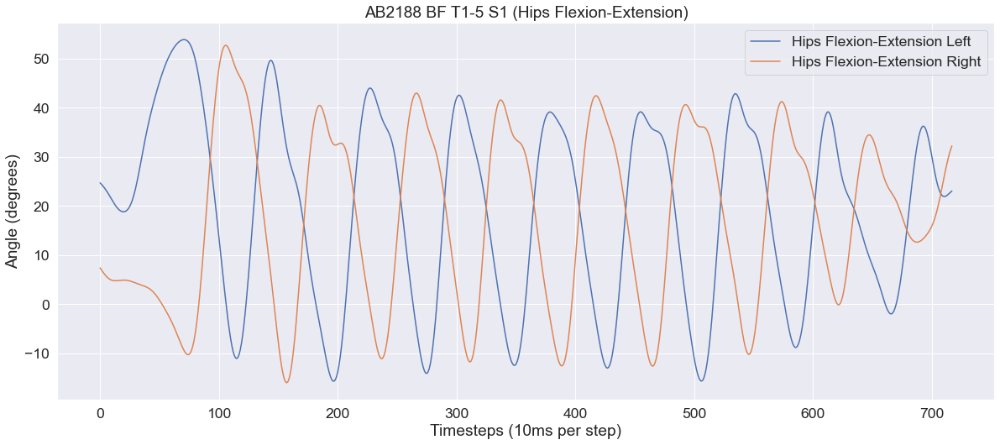

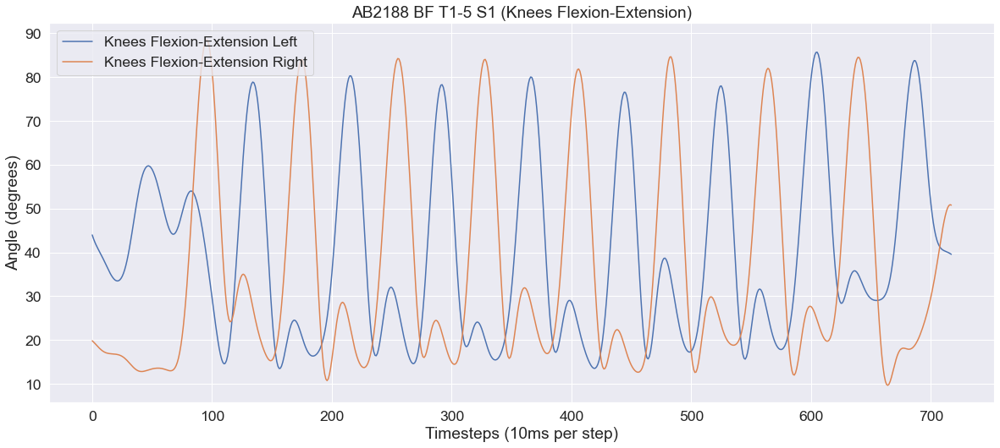

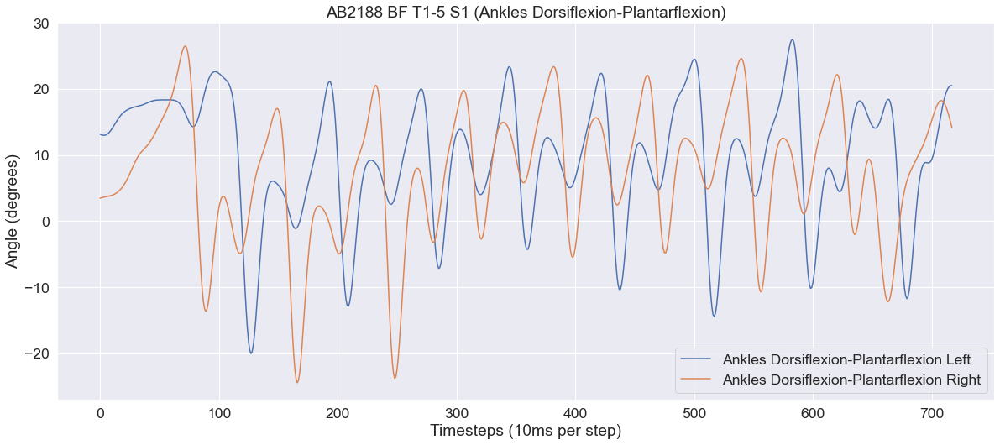

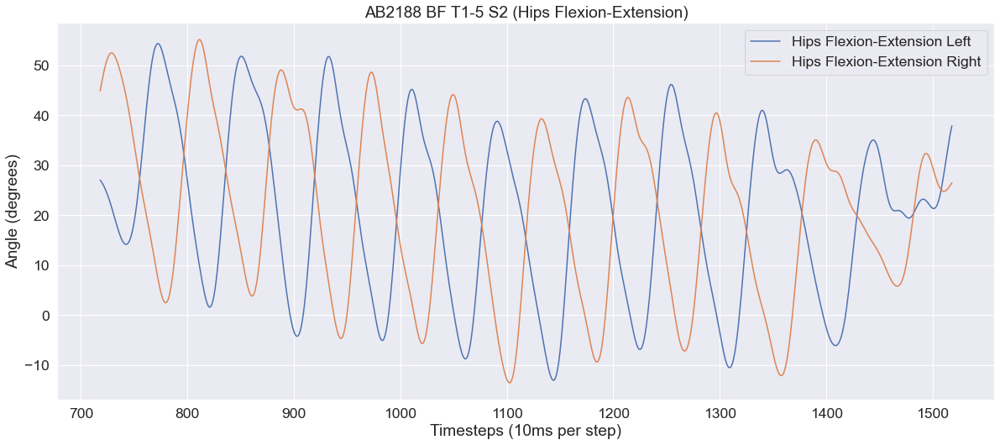

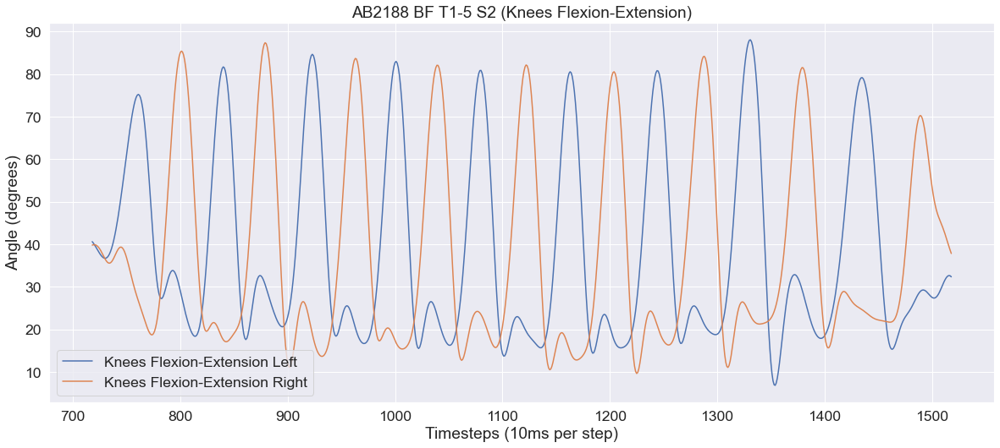

...

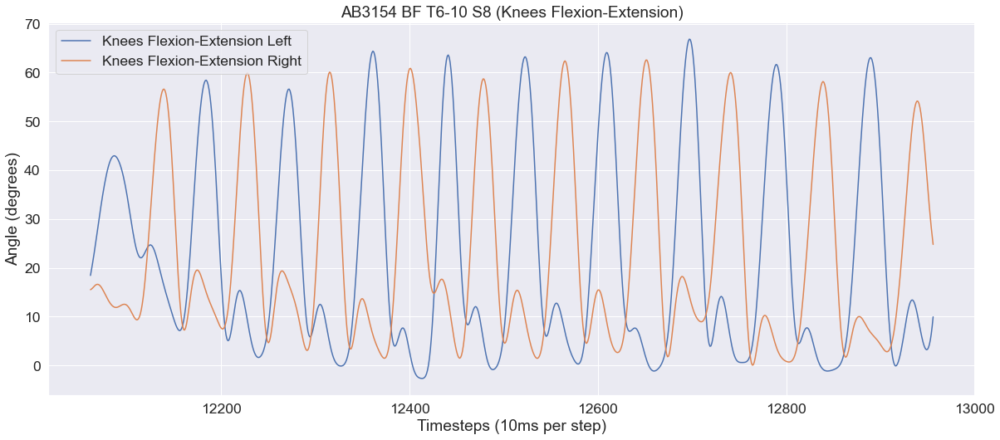

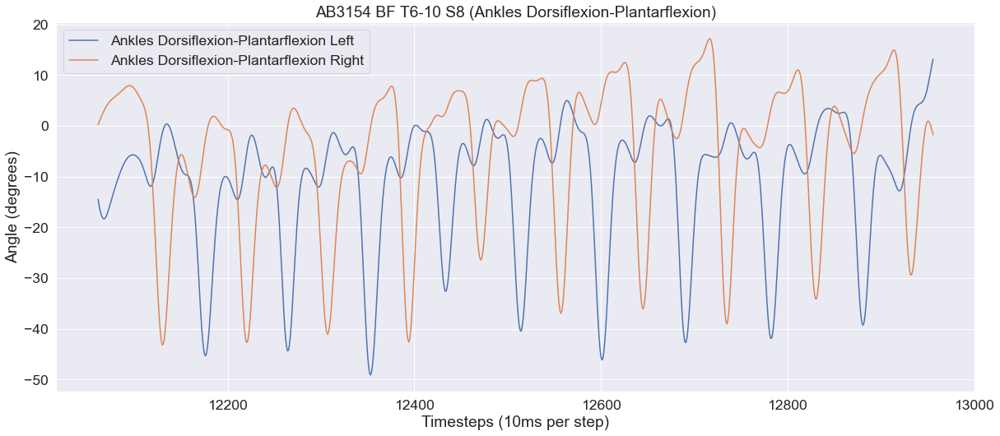

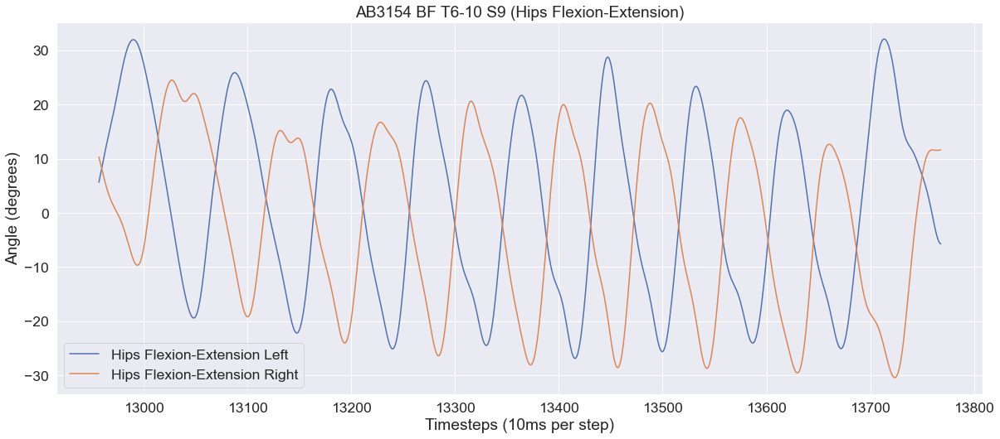

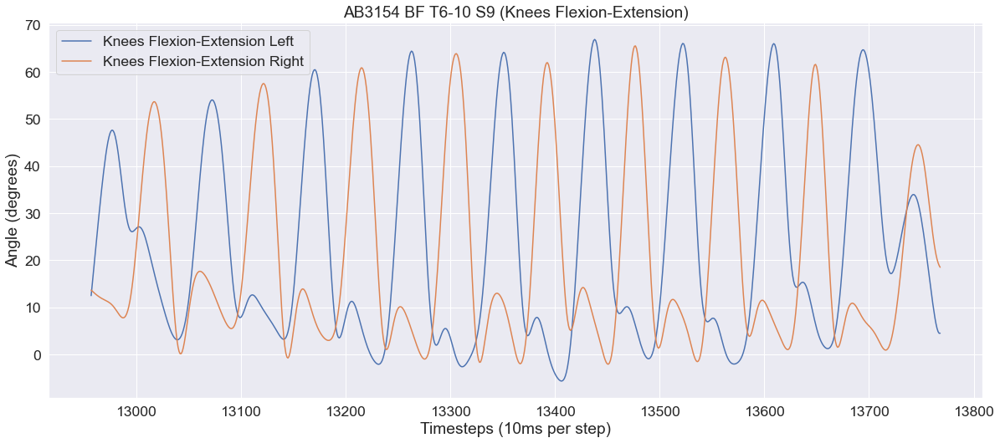

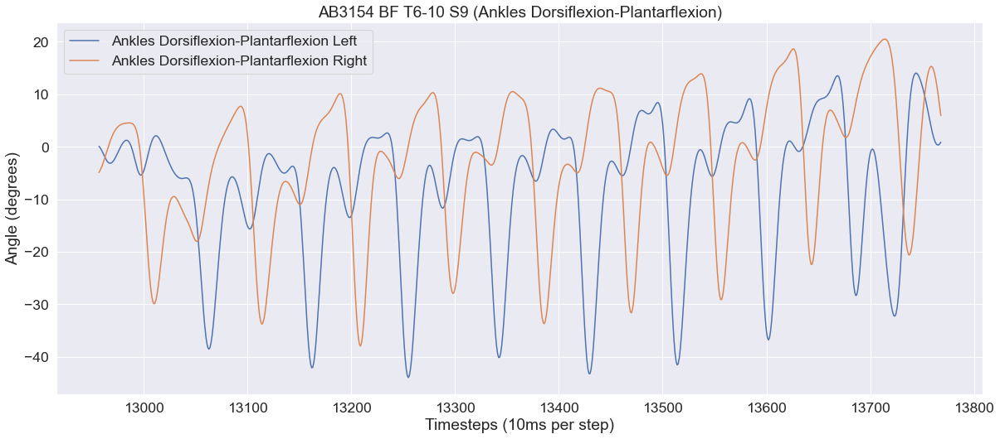

Timeseries is empty!
Trail 10 does not exist in AB3154 BF T6-10


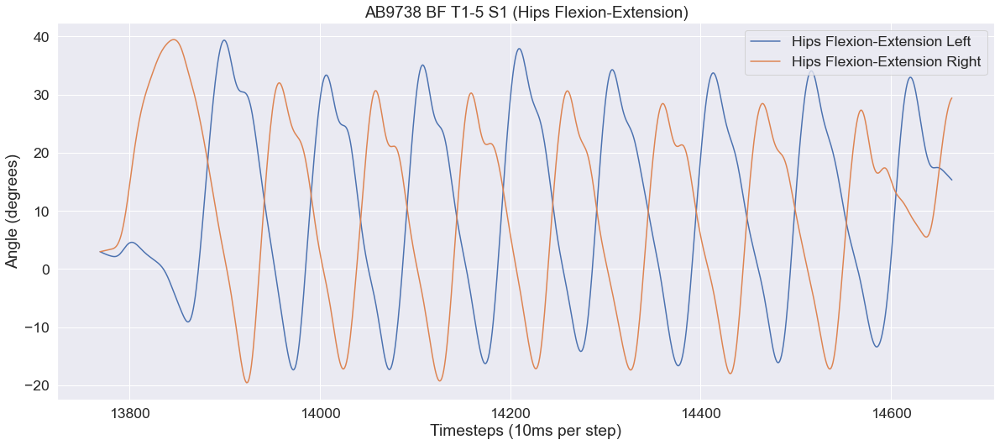

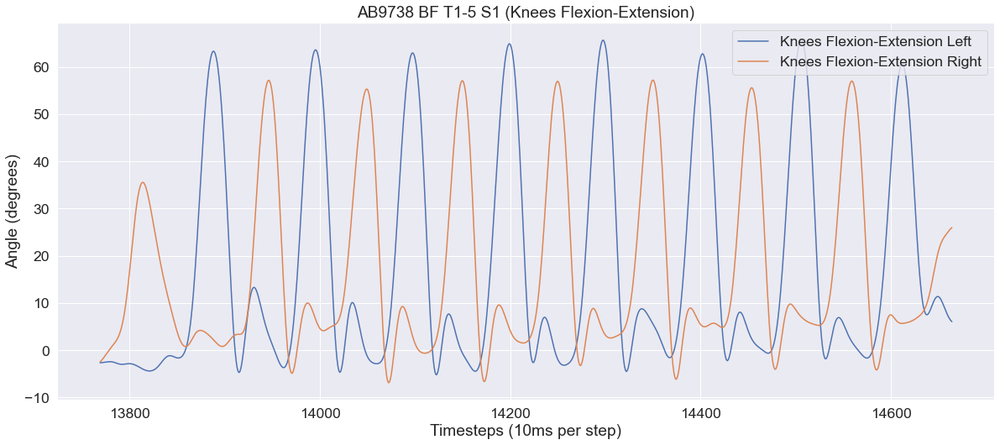

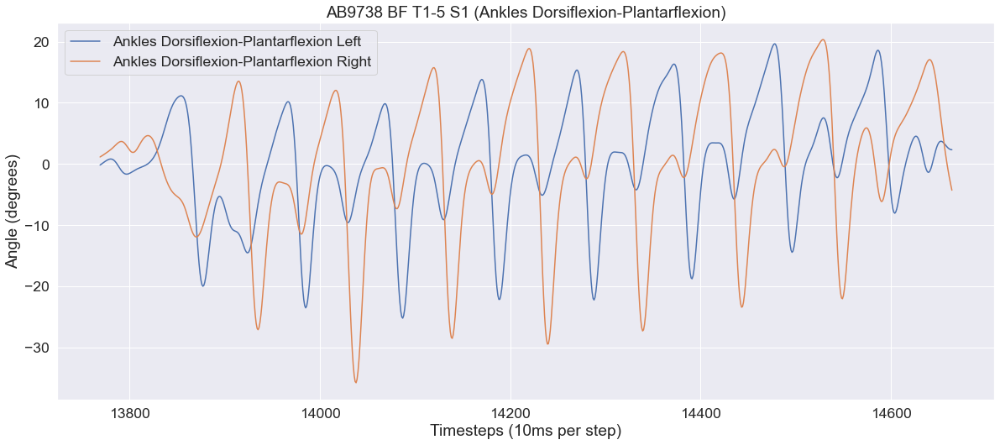

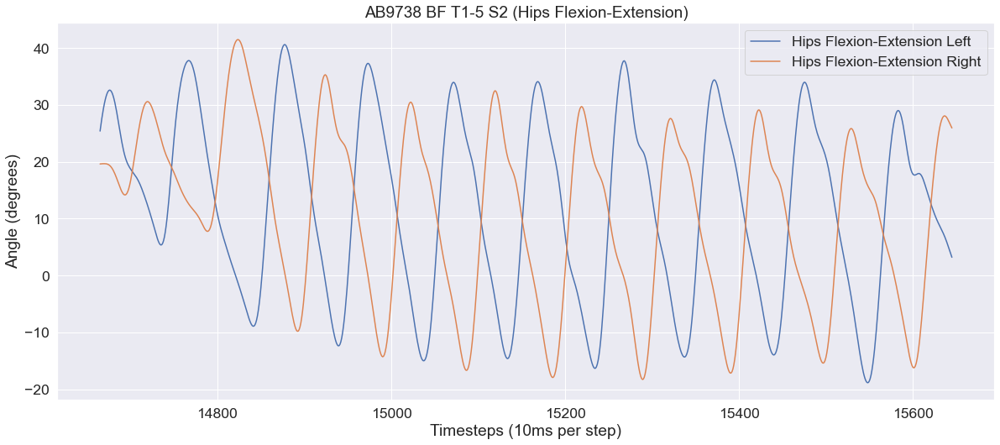

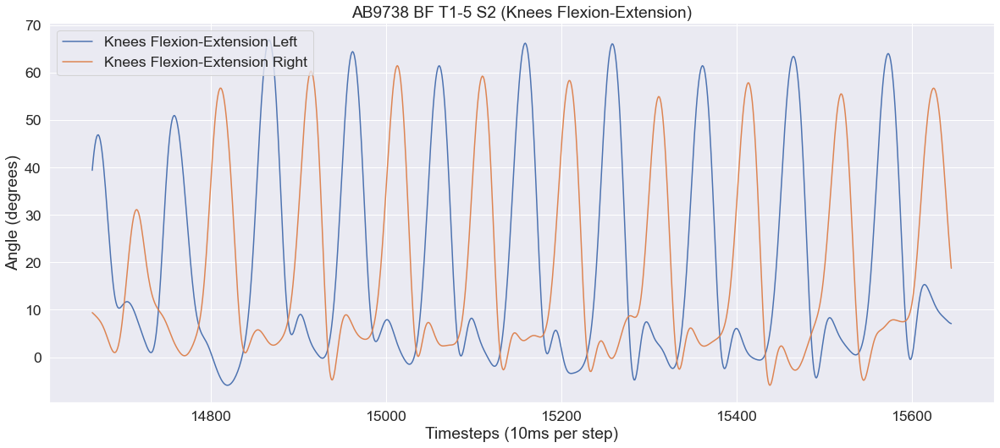

...

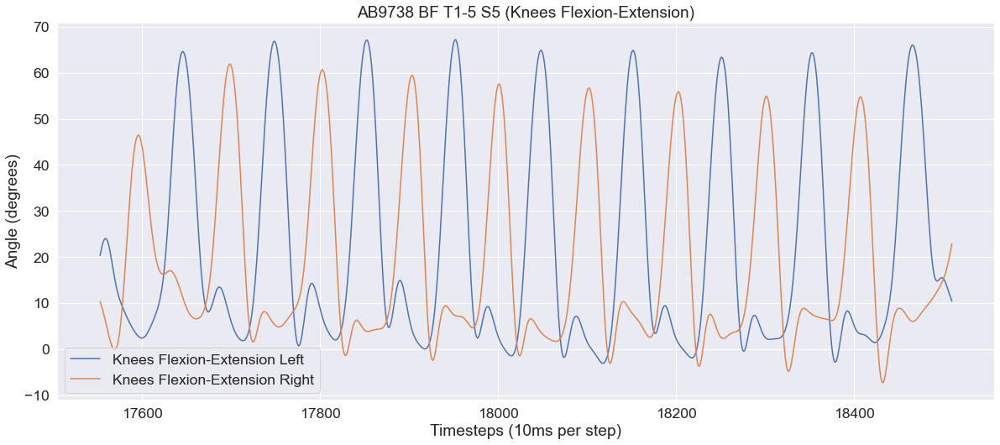

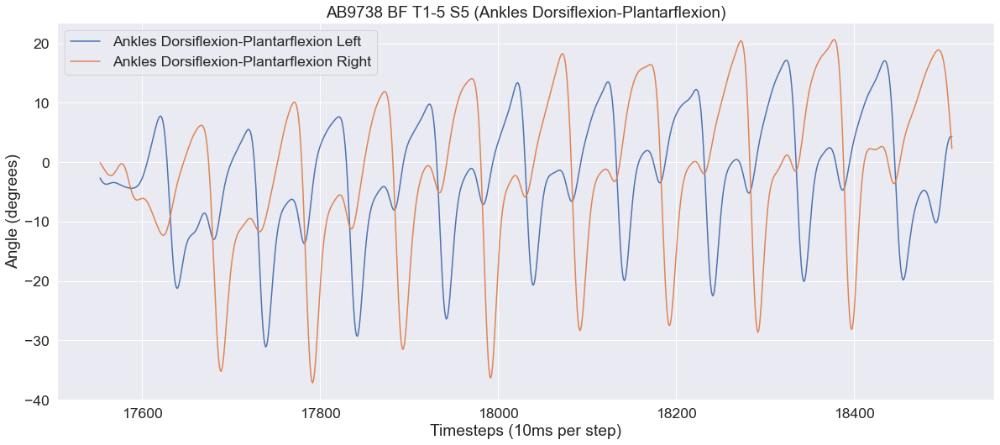

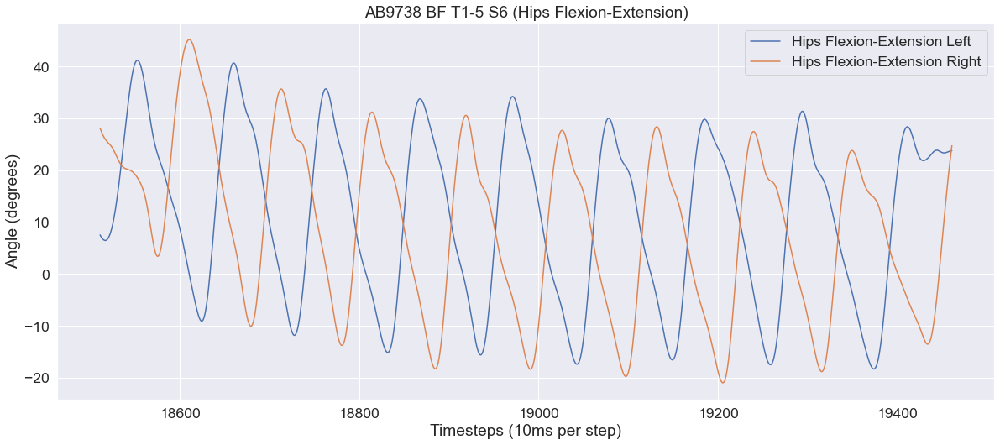

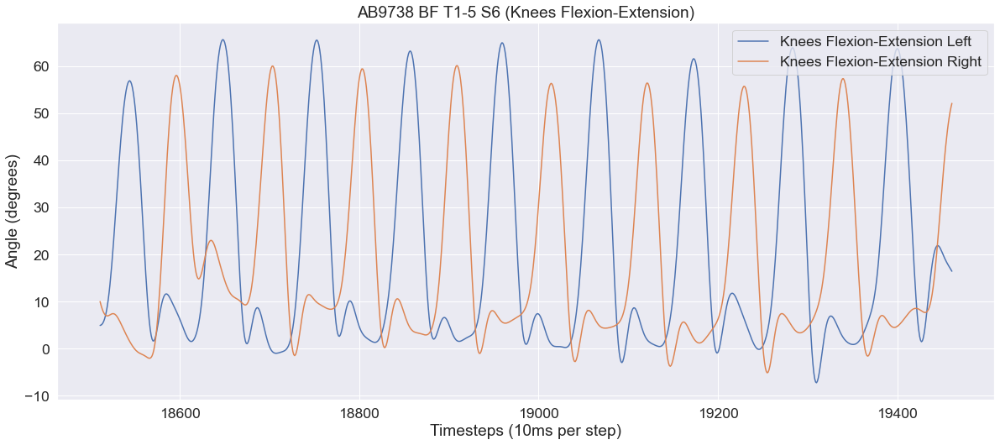

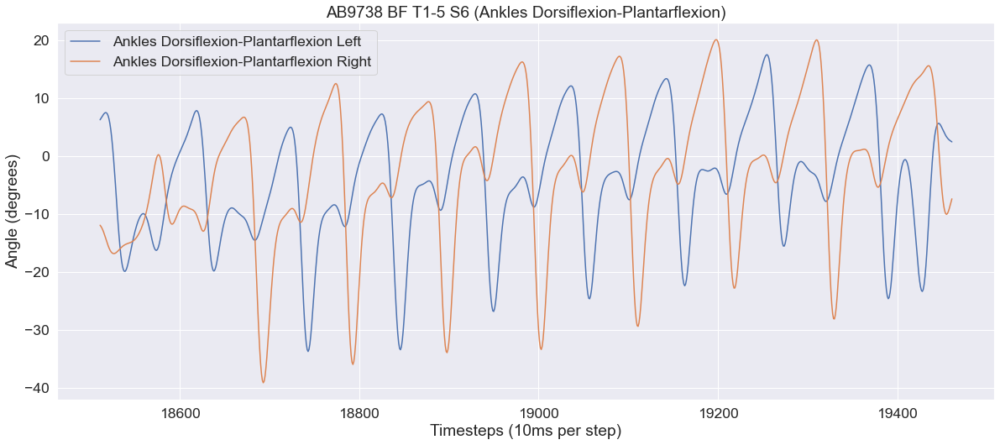

Timeseries is empty!
Trail 7 does not exist in AB9738 BF T1-5


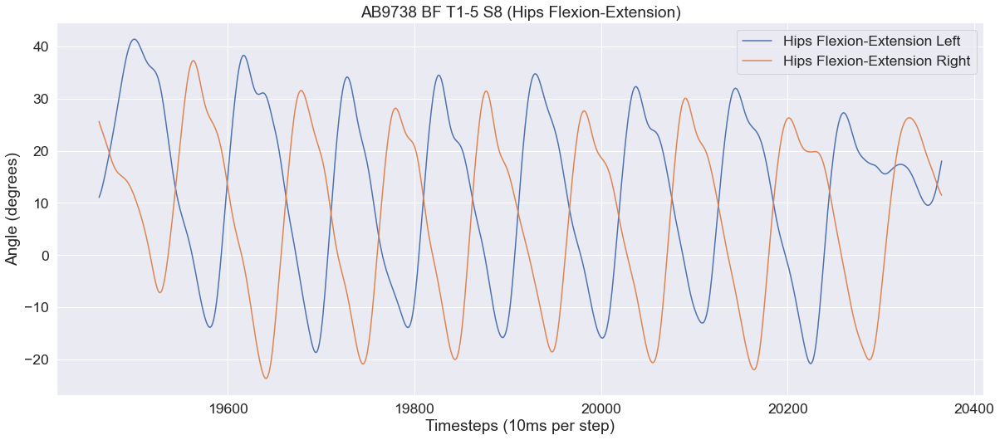

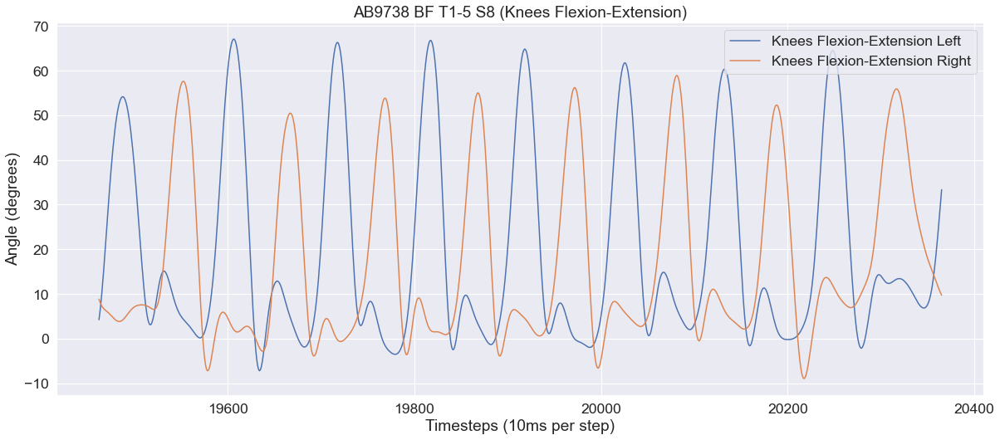

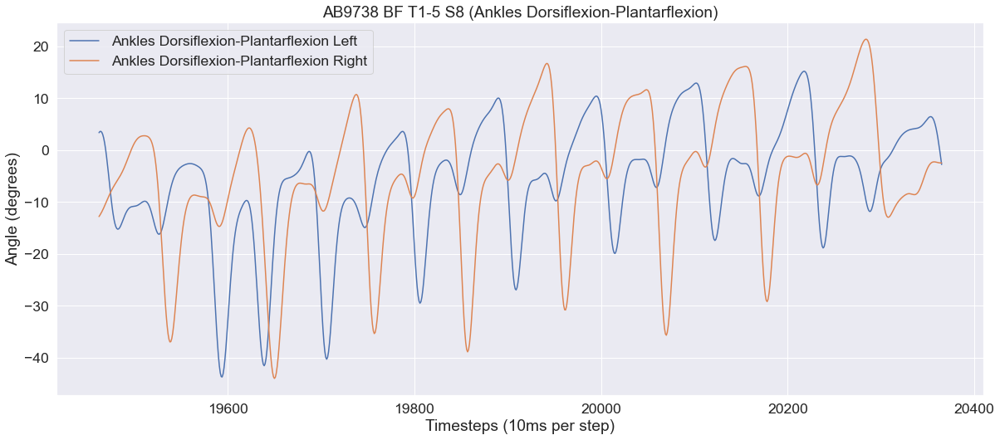

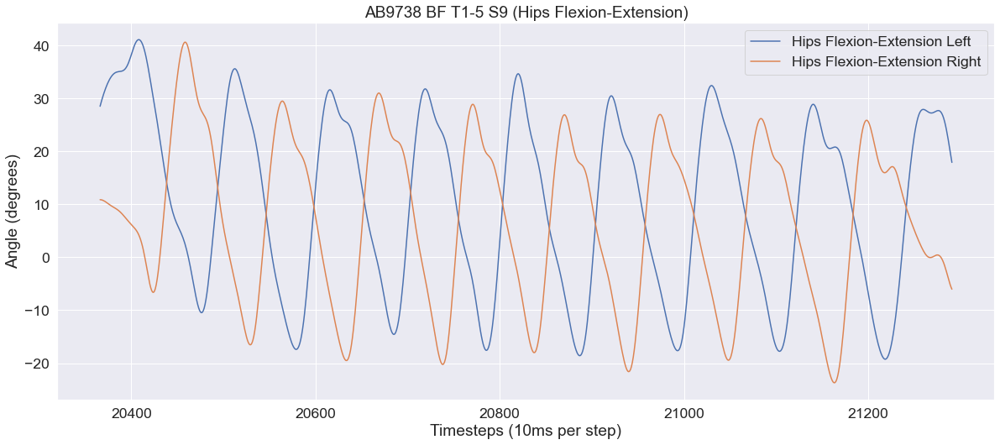

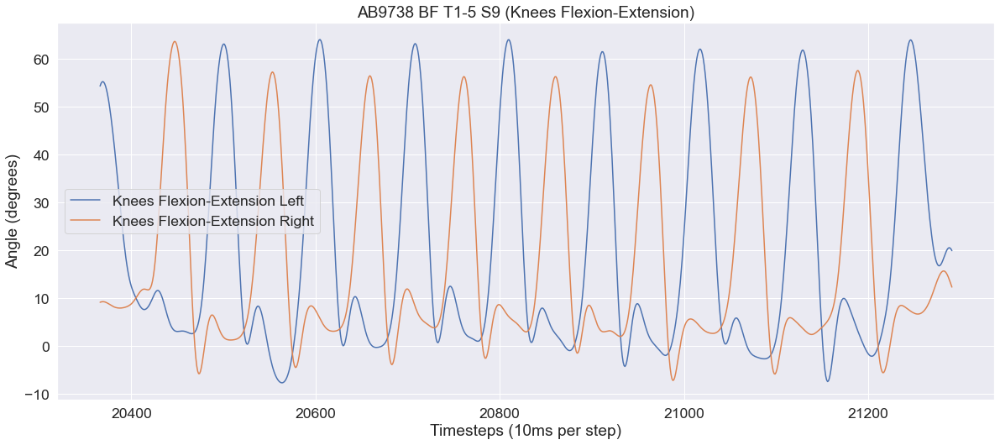

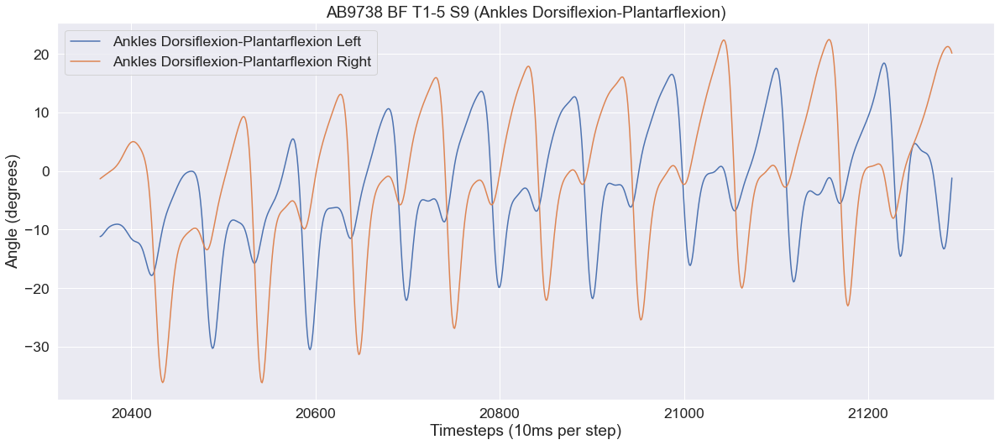

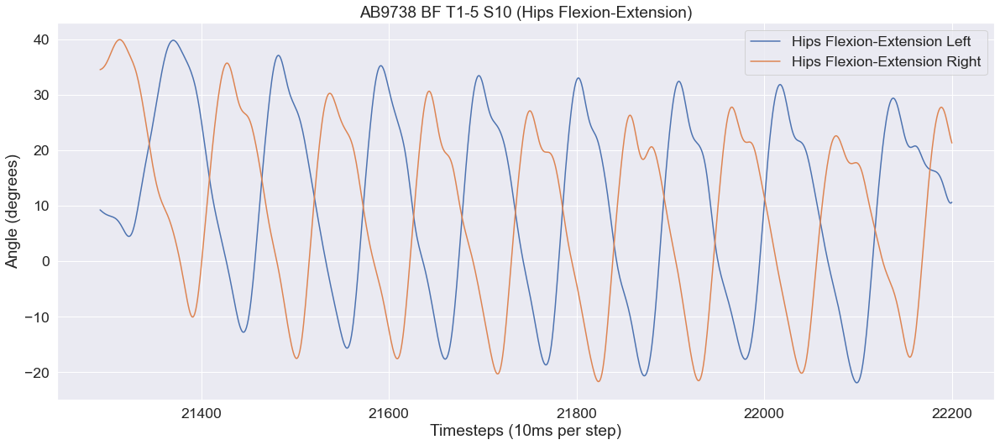

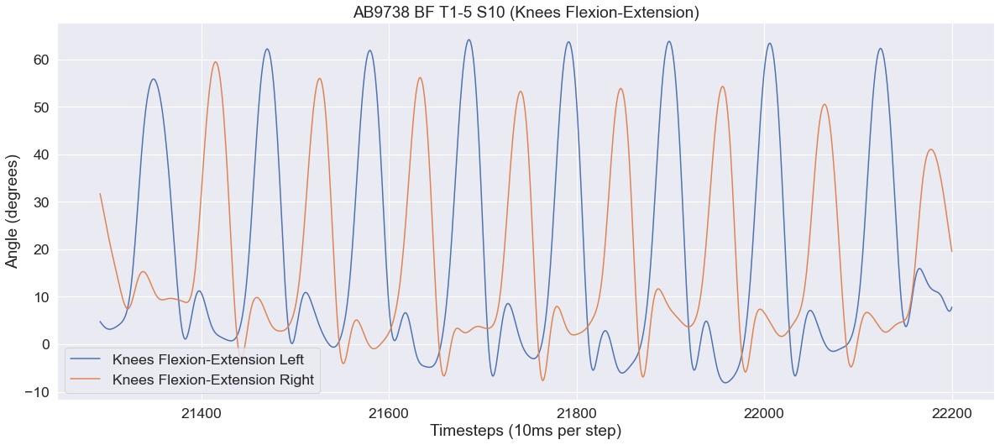

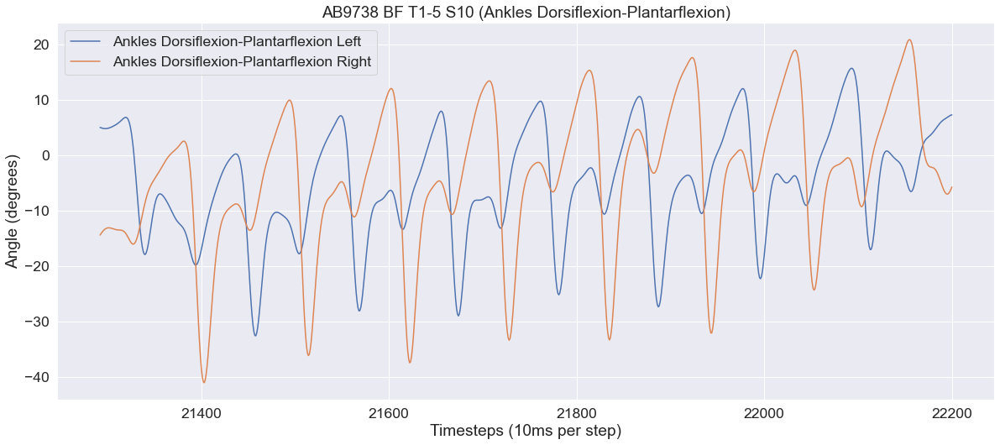

In [13]:
for p_ID in all_hlthy_subjects: #loop over healthy subjects

    for t_numb in range(1,n_trials+1): #loop over trials per subject
        
    # p_ID = 'AB3154 BF T6-10' #patient ID
    # t_numb = 1 #trial number 
        timeseries = all_data[(all_data['Patient ID'] == p_ID) & (all_data['Trial'] == t_numb)]

        if timeseries.empty: #check if data exists in this file
            print('Timeseries is empty!')
            print(f'Trail {t_numb} does not exist in {p_ID}')
            
        else:
            sns.set()

            
            rcParams['figure.figsize'] = 20,8.27
            sns.set(font_scale = 1.6)

            for f in range(0,3):
                ttl = features[f][:-5] #plotting the title wthout left and right
                path = r'D:\Study 2 Data\Plots\Healthy Gait Train and Val' +  '\\' + p_ID + ' ' + 'S' + str(t_numb) + ' (' + ttl+ ')' + '.png'
                plt.plot(timeseries[features[f]], label = features[f])
                plt.plot(timeseries[features[f+3]], label=features[f+3])
                plt.title(p_ID + ' ' + 'S' + str(t_numb) + ' (' + ttl+ ')')
                plt.legend()
                plt.xlabel('Timesteps (10ms per step)')
                plt.ylabel('Angle (degrees)')
                plt.savefig(path)
                plt.show()



## Data Analysis

In [14]:
all_data.isnull().sum()

Patient ID                                  0
Trial                                       0
Time                                        0
Hips Flexion-Extension Left                 0
Knees Flexion-Extension Left                0
Ankles Dorsiflexion-Plantarflexion Left     0
Hips Flexion-Extension Right                0
Knees Flexion-Extension Right               0
Ankles Dorsiflexion-Plantarflexion Right    0
dtype: int64

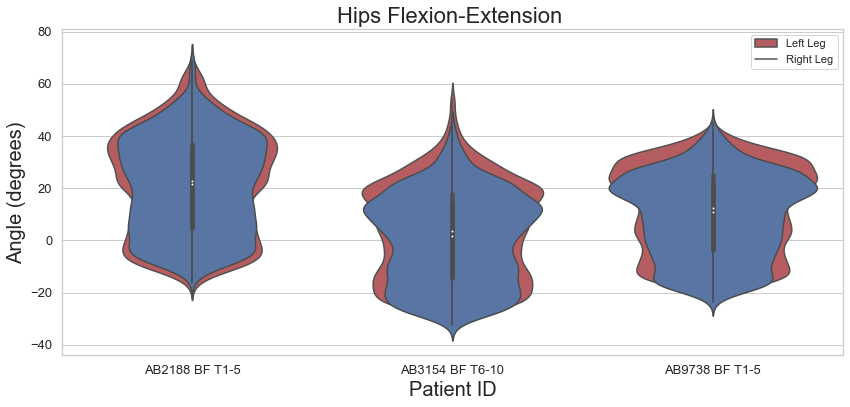

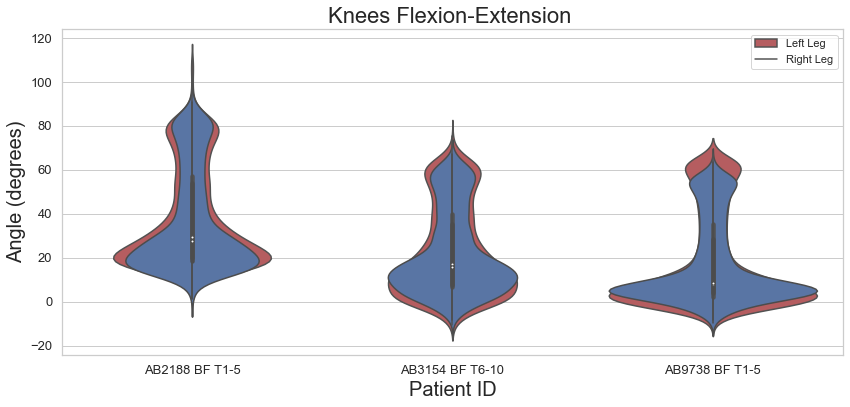

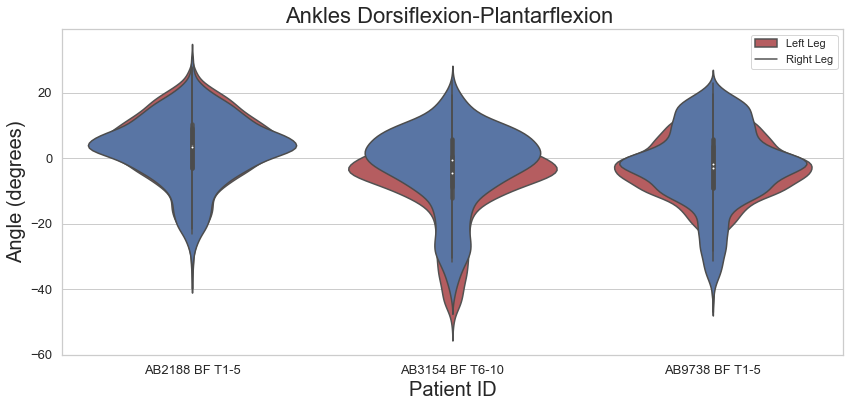

<Figure size 1008x432 with 0 Axes>

In [15]:
# violin plot of the distribution (x,y,z for left leg)
from matplotlib import rcParams

rcParams['figure.figsize'] = 14,6

sns.set_theme(style="whitegrid")

features_to_plt_left = ['Hips Flexion-Extension Left',
        'Knees Flexion-Extension Left',
        'Ankles Dorsiflexion-Plantarflexion Left',]

features_to_plt_right = ['Hips Flexion-Extension Right',
        'Knees Flexion-Extension Right',
        'Ankles Dorsiflexion-Plantarflexion Right',]

features_to_plt = zip(features_to_plt_left,features_to_plt_right)

for f in features_to_plt:

   
    ax= sns.violinplot(x="Patient ID", y=f[0], data=all_data, color="r", label='Left Leg')
    ax=sns.violinplot(x="Patient ID", y=f[1], data=all_data, color="b", label='Right Leg')
    
    ax.axes.set_title(f[1][:-5], fontsize=22)
    ax.set_xlabel("Patient ID",fontsize=20)
    ax.set_ylabel("Angle (degrees)",fontsize=20)
    ax.tick_params(labelsize=13)
    plt.legend(('Left Leg', 'Right Leg'), loc=1)
    plt.figure()

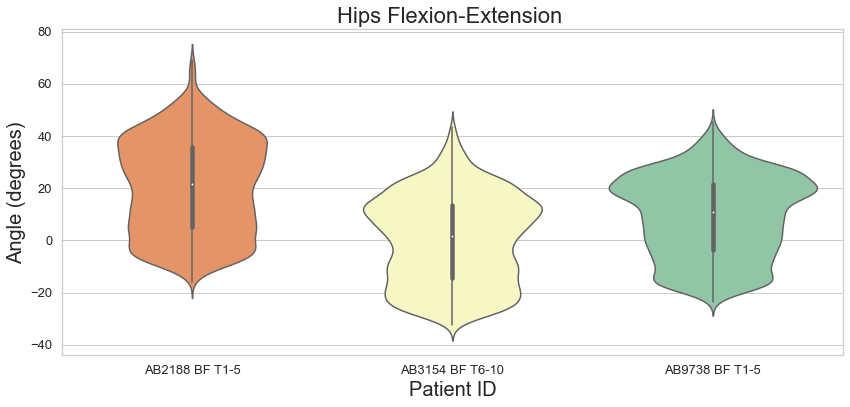

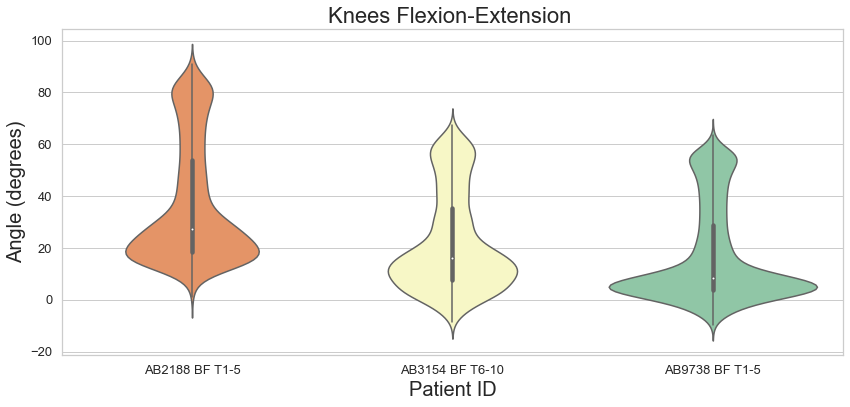

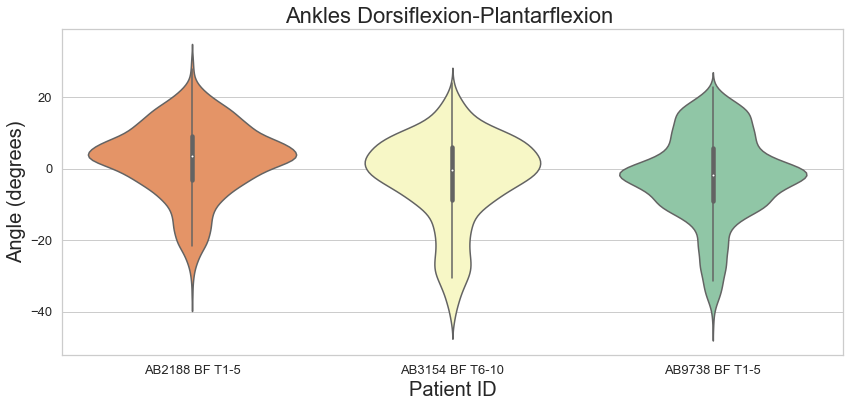

<Figure size 1008x432 with 0 Axes>

In [16]:
# violin plot of the distribution (x,y,z for left right)
from matplotlib import rcParams

rcParams['figure.figsize'] = 14,6

sns.set(font_scale=3)
sns.set_theme(style="whitegrid")

features_to_plt = ['Hips Flexion-Extension Right',
        'Knees Flexion-Extension Right',
        'Ankles Dorsiflexion-Plantarflexion Right',]

for f in features_to_plt:
    ax = sns.violinplot(x="Patient ID", y=f,  data=all_data, palette="Spectral")
    ax.axes.set_title(f[:-5], fontsize=22)
    ax.set_xlabel("Patient ID",fontsize=20)
    ax.set_ylabel("Angle (degrees)",fontsize=20)
    ax.tick_params(labelsize=13)

    plt.figure()

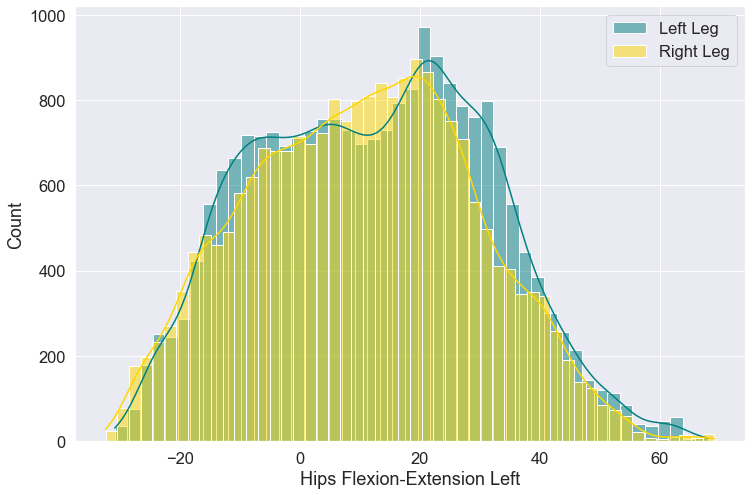

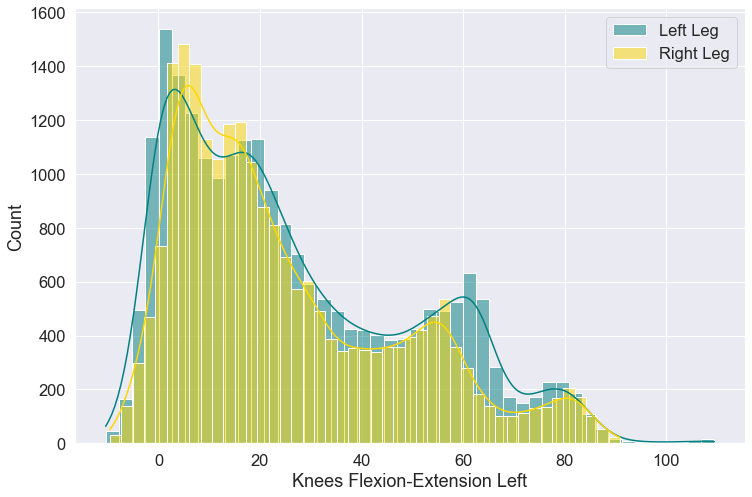

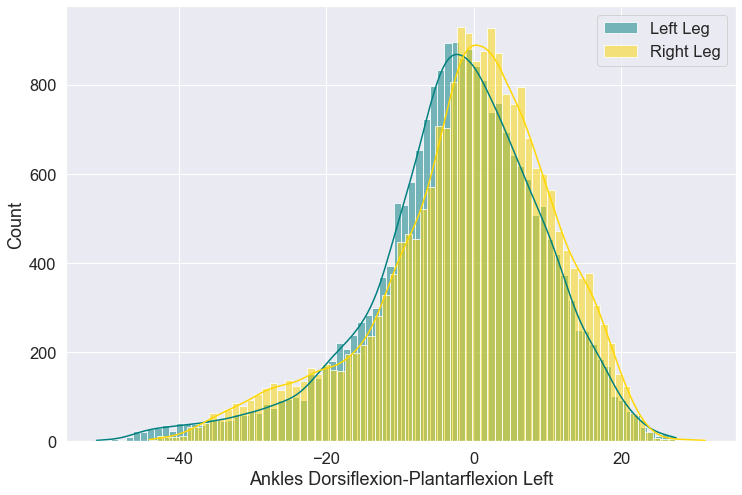

In [17]:
rcParams['figure.figsize'] = 12,8

sns.set_theme(style="darkgrid")
sns.set(font_scale=1.5)

features_to_plt = zip(features_to_plt_left,features_to_plt_right)

for f in features_to_plt:
    sns.histplot(all_data, x=f[0], color='teal', fill=True, kde=True, label='Left Leg')
    sns.histplot(all_data, x=f[1], color='gold', fill=True, kde=True, label='Right Leg')
    plt.legend()
    plt.show()

Text(0.5, 1.0, 'Hip Flexion-Extension Left for each trial')

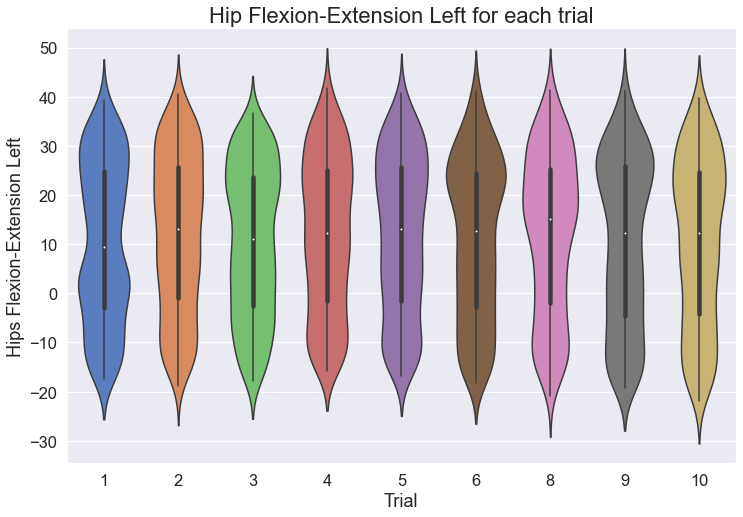

In [19]:
ax = sns.violinplot(x="Trial", y="Hips Flexion-Extension Left", 
                    data=all_data[all_data['Patient ID'] == "AB9738 BF T1-5"], palette="muted")
ax.axes.set_title('Hip Flexion-Extension Left for each trial', fontsize=22)

Text(0.5, 1.0, 'Hip Flexion-Extension Right for each trial')

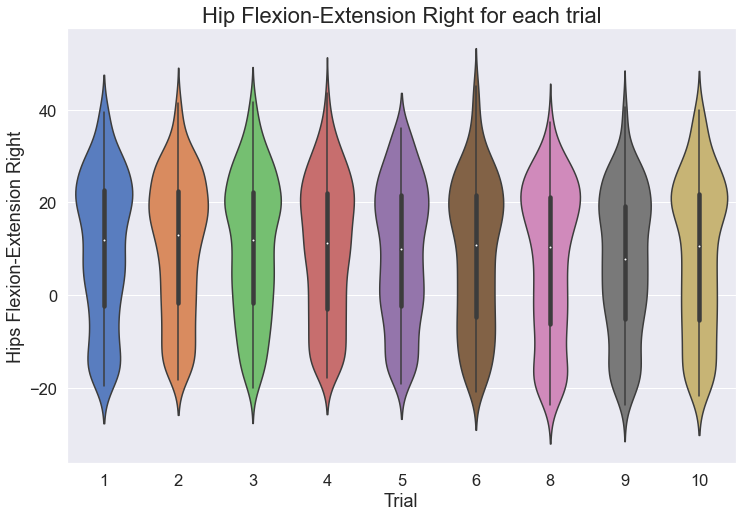

In [20]:
ax = sns.violinplot(x="Trial", y="Hips Flexion-Extension Right",
                    data=all_data[all_data['Patient ID'] == "AB9738 BF T1-5"], palette="muted")

ax.axes.set_title('Hip Flexion-Extension Right for each trial', fontsize=22)